# Spatial Correlation Analysis of Uncertainty Heatmaps

In this notebook we apply common spatial correlation metrics used for greyscale images to uncertainty heatmaps.

Goals:
- Extract meaningful scores reflecting spatial correlation of uncertainty values: Noise vs Structure, "Local vs Global Uncertainty", etc.
- Apply these metrics to toy data and real uncertainty maps, compare them and assess their reliability in practice.

Metrics:
- Moran's I
- Geary's C
- Grey-level Co-occurence Matrix (GLCM)

Note: For GLCM, we consider its correlation component. However, this is almost identical to Moran's I (for the choice of radius=1 and angle=0). Hence we will focus more on Moran's I.

In [1]:
# Firstly, we import necessary packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

from aggrigator.uncertainty_maps import UncertaintyMap
from aggrigator.methods import AggregationMethods as am
from aggrigator.summary import AggregationSummary
from aggrigator.strategylist import StrategyList
from aggrigator.util import generate_disk_bdry_mask, generate_disk_mask
from aggrigator.datasets import generate_binary_quadrant_array, generate_checkerboard_array

%load_ext autoreload
%autoreload 2

## Basic Example

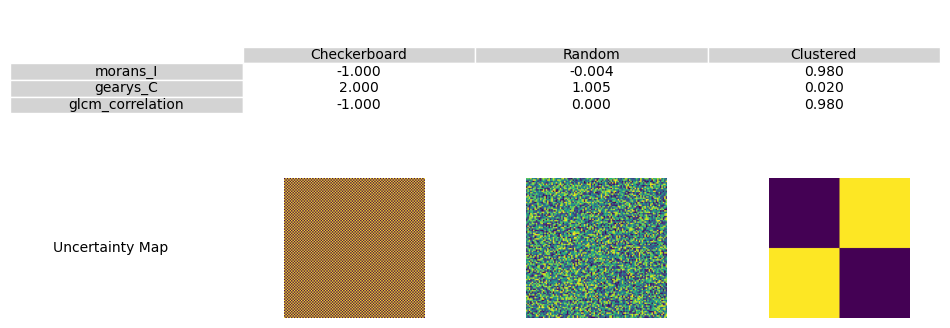

In [27]:
size = 100
array_1 = generate_checkerboard_array(size)
unc_map_1 = UncertaintyMap(array=array_1, mask=None, name="Checkerboard")

array_2 = np.random.random((100,100))
unc_map_2 = UncertaintyMap(array=array_2, mask=None, name="Random")

array_3 = generate_binary_quadrant_array(size)
unc_map_3 = UncertaintyMap(array=array_3, mask=None, name="Clustered")

summary = AggregationSummary(StrategyList.SPATIAL)
result = summary.apply_methods([unc_map_1, unc_map_2, unc_map_3], save_to_excel=False, do_plot=True, max_value=1.0)

# Analysis of Arctique Heatmaps

In [ ]:
def get_arctique_slice_arrays(slice, dataset):
    # Load arrays
    path = os.path.join(os.getcwd(), "..", "..", "data", dataset)
    files = os.listdir(path)
    arrays = [np.load(os.path.join(path, file)) for file in files] # 3D arrays, shape (50,512,512)
    if len(arrays[0].shape) == 3:
        arrays = [array[slice,:,:] for array in arrays]
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    return arrays, files

In [5]:
# Get spatial aggregation summary
SLICE = 75
DATASET = "lizard_uq_maps"
#DATASET = "arctique_uq_maps"

arrays, filenames = get_arctique_slice_arrays(SLICE, DATASET)
unc_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arrays, filenames)]
strategy_list = [(am.gearys_C, None), (am.morans_I, None), (am.glcm_correlation, None), (am.mean, None)]

summary = AggregationSummary(strategy_list, name=f"spatial_analysis_{DATASET}_slice_{SLICE}", num_cpus=12)
spatial_df = summary.apply_methods(unc_maps, save_to_excel=False, do_plot=False, max_value=1.0)
spatial_df

Using 8 CPUs.


,Name,instance_noise_0_LizardData_0_00_dropout_au.npy,instance_noise_0_LizardData_0_00_dropout_eu.npy,instance_noise_0_LizardData_0_00_dropout_pu.npy,instance_noise_0_LizardData_0_00_ensemble_au.npy,instance_noise_0_LizardData_0_00_ensemble_eu.npy,instance_noise_0_LizardData_0_00_ensemble_pu.npy,instance_noise_0_LizardData_0_00_softmax_pu.npy,instance_noise_0_LizardData_0_00_tta_au.npy,instance_noise_0_LizardData_0_00_tta_eu.npy,...,semantic_noise_0_LizardData_0_00_dropout_au.npy,semantic_noise_0_LizardData_0_00_dropout_eu.npy,semantic_noise_0_LizardData_0_00_dropout_pu.npy,semantic_noise_0_LizardData_0_00_ensemble_au.npy,semantic_noise_0_LizardData_0_00_ensemble_eu.npy,semantic_noise_0_LizardData_0_00_ensemble_pu.npy,semantic_noise_0_LizardData_0_00_softmax_pu.npy,semantic_noise_0_LizardData_0_00_tta_au.npy,semantic_noise_0_LizardData_0_00_tta_eu.npy,semantic_noise_0_LizardData_0_00_tta_pu.npy
0,gearys_C,0.077117,0.106038,0.076764,0.080685,0.567592,0.080695,0.158532,0.072789,0.168400,...,0.045944,0.047829,0.045735,0.047041,0.434820,0.047037,0.069128,0.043326,0.049964,0.043057
1,morans_I,0.920871,0.896987,0.921350,0.917278,0.433947,0.917271,0.838718,0.925469,0.832409,...,0.950986,0.955236,0.951336,0.949795,0.566482,0.949806,0.930323,0.953633,0.948098,0.953874
2,glcm_correlation,0.925627,0.897777,0.926028,0.922450,0.439283,0.922430,0.846476,0.930209,0.832899,...,0.954972,0.954234,0.955226,0.953879,0.572296,0.953880,0.932647,0.957512,0.951326,0.957783
3,mean,0.255549,0.045301,0.258615,0.254259,0.038817,0.254342,0.176268,0.261330,0.051594,...,0.263860,0.053914,0.266422,0.264101,0.049760,0.264195,0.252293,0.283730,0.066852,0.274866


## Plot Edge Case Heatmaps

In [6]:
# Plot 10 unc maps with lowest and highest values
import matplotlib.pyplot as plt

def plot_extremal_heatmaps(arrays, method, N=10):
    method_values = {i: spatial_df[spatial_df["Name"]==method][filenames[i]].values[0] for i in range(len(arrays))}

    vals_sorted_ascending = [idx for idx, val in sorted(method_values.items(), key=lambda x: x[1])]
    min_heatmaps = {i: arrays[i] for i in vals_sorted_ascending[:N]}
    max_heatmaps = {i: arrays[i] for i in vals_sorted_ascending[-N:]}

    fig, axes = plt.subplots(1, N, figsize=(3*N, 3))
    # Plot each image in a separate subplot
    for ax, (idx, img) in zip(axes, min_heatmaps.items()):
        ax.imshow(img, cmap="viridis", vmin=0, vmax=1)  # Plot as grayscale
        ax.axis("off")  # Hide axes for better visualization
        val = f"{method_values[idx]:.3f}"
        ax.text(0.5, -0.15, val, fontsize=12, ha="center", va="center", transform=ax.transAxes)  # Add text
    fig.suptitle(f"{N} minimal heatmaps for {method}", fontsize=16)

    fig, axes = plt.subplots(1, N, figsize=(3*N, 3))
    # Plot each image in a separate subplot
    for ax, (idx, img) in zip(axes, max_heatmaps.items()):
        ax.imshow(img, cmap="viridis", vmin=0, vmax=1)  # Plot as grayscale
        ax.axis("off")  # Hide axes for better visualization
        val = f"{method_values[idx]:.3f}"
        ax.text(0.5, -0.15, val, fontsize=12, ha="center", va="center", transform=ax.transAxes)  # Add text
    fig.suptitle(f"{N} maximal heatmaps for {method}", fontsize=16)

    plt.show()


Moran's I


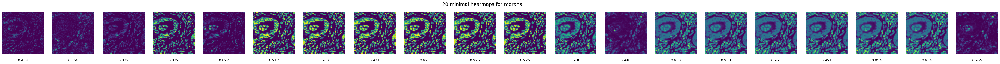

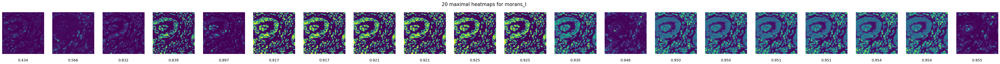

Geary's C


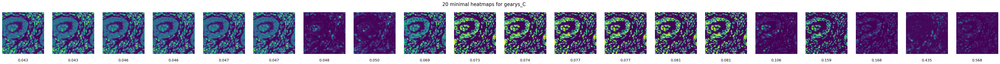

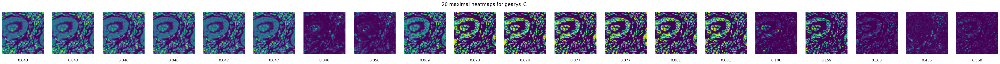

GLCM


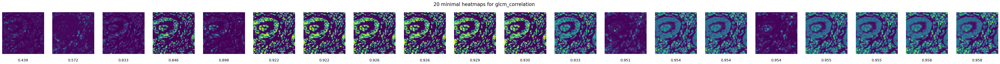

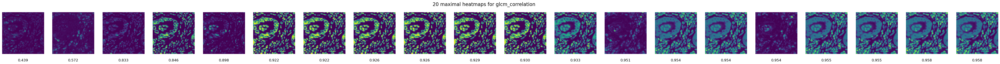

In [7]:
# Moran's I
print("Moran's I")
plot_extremal_heatmaps(arrays, "morans_I", 20)
# Geary's C
print("Geary's C")
plot_extremal_heatmaps(arrays, "gearys_C", 20)
# GLCM
print("GLCM")
plot_extremal_heatmaps(arrays, "glcm_correlation", 20)

## Correlation Matrix

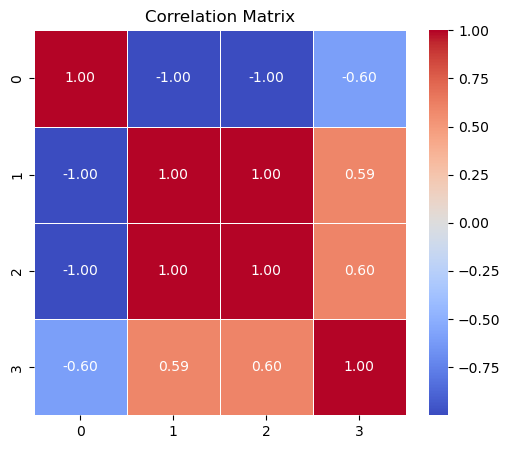

In [8]:
# Compute correlation matrix
df = spatial_df[filenames].T
corr_matrix = df.corr()

# Plot the correlation matrix
plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

##  Range of Aggregation Scores

For each metric we are interested how well the capture the variety of uncertainty heatmaps present in the dataset.
Ideally, a good score should have a high range of values, indicating its ability to capture qualitative differences across heatmaps.

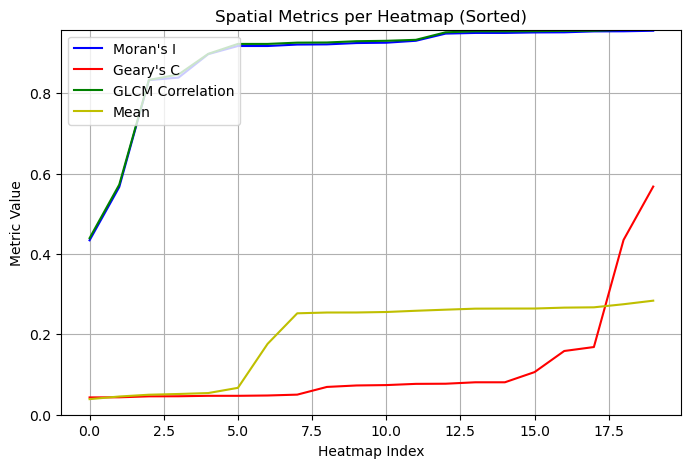

In [9]:
def sort_vals(df, method):
    geary_vals = df[df["Name"]==method].values[:,1:].tolist()[0]
    sorted_indices = np.argsort(geary_vals)  # Indices that would sort geary_vals
    sorted_values = np.array(geary_vals)[sorted_indices]  # Sort values
    return sorted_values

moran_val = sort_vals(spatial_df, "morans_I")
geary_val = sort_vals(spatial_df, "gearys_C")
glcm_val = sort_vals(spatial_df, "glcm_correlation")
mean_val = sort_vals(spatial_df, "mean")
x = [i for i, _ in enumerate(filenames)]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(x, moran_val, linestyle="-", color="b", label="Moran's I")
plt.plot(x, geary_val, linestyle="-", color="r", label="Geary's C")
plt.plot(x, glcm_val, linestyle="-", color="g", label="GLCM Correlation")
plt.plot(x, mean_val, linestyle="-", color="y", label="Mean")
# Labels, title, and legend
plt.xlabel("Heatmap Index")
plt.ylabel("Metric Value")
plt.title("Spatial Metrics per Heatmap (Sorted)")
# Get max y-value for setting the axis limits
max_y = max(max(moran_val), max(geary_val), max(glcm_val))
plt.ylim(0, max_y)  # Set y-axis range
plt.grid(True)
plt.legend(loc="upper left")  # Show legend with appropriate labels
# Show plot
plt.show()


# Counterexamples

Goal: Find heatmaps that have similar mean but different spatial correlation metrics.

In [10]:
method_names = spatial_df["Name"].tolist()
# Sort all columns based on values in the "mean" row
sorted_columns = spatial_df[filenames].loc[method_names.index("mean")].sort_values().index
# Reorder columns in reduced_df (keeping "Name" as the first column)
sorted_df = spatial_df[["Name"]+sorted_columns.tolist()]
sorted_df

,Name,instance_noise_0_LizardData_0_00_ensemble_eu.npy,instance_noise_0_LizardData_0_00_dropout_eu.npy,semantic_noise_0_LizardData_0_00_ensemble_eu.npy,instance_noise_0_LizardData_0_00_tta_eu.npy,semantic_noise_0_LizardData_0_00_dropout_eu.npy,semantic_noise_0_LizardData_0_00_tta_eu.npy,instance_noise_0_LizardData_0_00_softmax_pu.npy,semantic_noise_0_LizardData_0_00_softmax_pu.npy,instance_noise_0_LizardData_0_00_ensemble_au.npy,...,instance_noise_0_LizardData_0_00_dropout_au.npy,instance_noise_0_LizardData_0_00_dropout_pu.npy,instance_noise_0_LizardData_0_00_tta_au.npy,semantic_noise_0_LizardData_0_00_dropout_au.npy,semantic_noise_0_LizardData_0_00_ensemble_au.npy,semantic_noise_0_LizardData_0_00_ensemble_pu.npy,semantic_noise_0_LizardData_0_00_dropout_pu.npy,instance_noise_0_LizardData_0_00_tta_pu.npy,semantic_noise_0_LizardData_0_00_tta_pu.npy,semantic_noise_0_LizardData_0_00_tta_au.npy
0,gearys_C,0.567592,0.106038,0.434820,0.168400,0.047829,0.049964,0.158532,0.069128,0.080685,...,0.077117,0.076764,0.072789,0.045944,0.047041,0.047037,0.045735,0.073731,0.043057,0.043326
1,morans_I,0.433947,0.896987,0.566482,0.832409,0.955236,0.948098,0.838718,0.930323,0.917278,...,0.920871,0.921350,0.925469,0.950986,0.949795,0.949806,0.951336,0.924637,0.953874,0.953633
2,glcm_correlation,0.439283,0.897777,0.572296,0.832899,0.954234,0.951326,0.846476,0.932647,0.922450,...,0.925627,0.926028,0.930209,0.954972,0.953879,0.953880,0.955226,0.929206,0.957783,0.957512
3,mean,0.038817,0.045301,0.049760,0.051594,0.053914,0.066852,0.176268,0.252293,0.254259,...,0.255549,0.258615,0.261330,0.263860,0.264101,0.264195,0.266422,0.267185,0.274866,0.283730


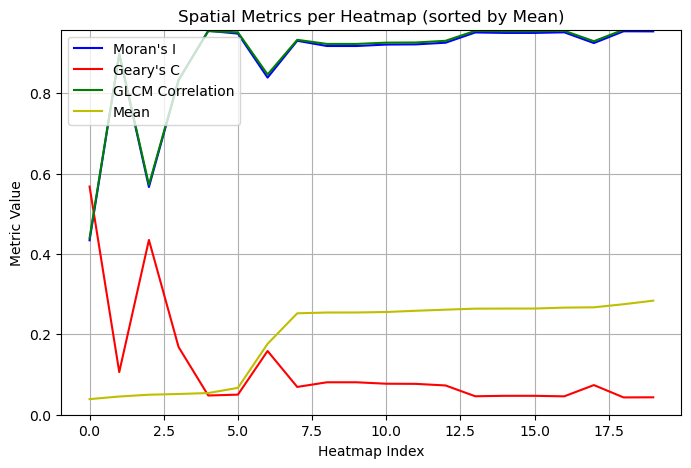

In [11]:
moran_val = list(sorted_df[sorted_columns].loc[method_names.index("morans_I")])
geary_val = list(sorted_df[sorted_columns].loc[method_names.index("gearys_C")])
glcm_val = list(sorted_df[sorted_columns].loc[method_names.index("glcm_correlation")])
mean_val = list(sorted_df[sorted_columns].loc[method_names.index("mean")])
x = [i for i, _ in enumerate(filenames)]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(x, moran_val, linestyle="-", color="b", label="Moran's I")
plt.plot(x, geary_val, linestyle="-", color="r", label="Geary's C")
plt.plot(x, glcm_val, linestyle="-", color="g", label="GLCM Correlation")
plt.plot(x, mean_val, linestyle="-", color="y", label="Mean")
# Labels, title, and legend
plt.xlabel("Heatmap Index")
plt.ylabel("Metric Value")
plt.title("Spatial Metrics per Heatmap (sorted by Mean)")
# Get max y-value for setting the axis limits
max_y = max(max(moran_val), max(geary_val), max(glcm_val))
plt.ylim(0, max_y)  # Set y-axis range
plt.grid(True)
plt.legend(loc="upper left")  # Show legend with appropriate labels
# Show plot
plt.show()

We see that only Geary's C does have strong variance in values among heatmaps sharing the same mean.
Let us extract heatmaps that have minimal and maximal Geary's C while having similar mean.

In [16]:
# Find a heatmap file that has similar mean (lying between a and b) but different Geary's C
def min_max_heatmap(method, a, b):
    values = sorted_df[filenames].astype(float)
    filtered_columns = values.loc[method_names.index("mean")].between(a, b)
    selected_columns = values.columns[filtered_columns].tolist()
    selected_df = values[selected_columns]

    # Extract row with index 1
    method_row = selected_df.loc[method_names.index(method)]
    # Find column names for min and max values
    min_col = method_row.idxmin()  # Column with min value
    print("Min: ", method_row.min(), min_col)
    max_col = method_row.idxmax()  # Column with max value
    print("Max: ", method_row.max(), max_col)
    return [min_col, max_col]

def sorted_heatmaps_by_mean(method, a, b):
    values = sorted_df[filenames].astype(float)
    filtered_columns = values.loc[method_names.index("mean")].between(a, b)
    selected_columns = values.columns[filtered_columns].tolist()
    selected_df = values[selected_columns]

    # Extract row with index 1
    method_row = selected_df.loc[method_names.index(method)]
    file_val_dict = method_row.to_dict()
    sorted_file_val_dict = dict(sorted(file_val_dict.items(), key=lambda x: x[1]))
    return sorted_file_val_dict

min_max_heatmap("gearys_C", 0.2, 0.3)

#sorted_heatmaps_by_mean("gearys_C", 0.2, 0.3)

Min:  0.04305650148601681 semantic_noise_0_LizardData_0_00_tta_pu.npy
Max:  0.08069520536564613 instance_noise_0_LizardData_0_00_ensemble_pu.npy


['semantic_noise_0_LizardData_0_00_tta_pu.npy',
 'instance_noise_0_LizardData_0_00_ensemble_pu.npy']

Example for Geary's C
Min:  0.10603843976520905 instance_noise_0_LizardData_0_00_dropout_eu.npy
Max:  0.5675921810282081 instance_noise_0_LizardData_0_00_ensemble_eu.npy


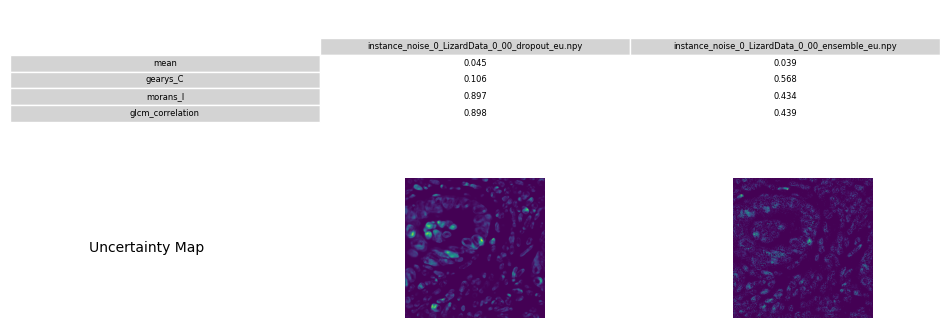

,Name,instance_noise_0_LizardData_0_00_dropout_eu.npy,instance_noise_0_LizardData_0_00_ensemble_eu.npy
0,mean,0.045301,0.038817
1,gearys_C,0.106038,0.567592
2,morans_I,0.896987,0.433947
3,glcm_correlation,0.897777,0.439283


In [26]:
# Plot heatmaps having similar mean but different spatial metric scores:

print("Example for Geary's C")
min_max_files = min_max_heatmap("gearys_C", 0.0, 0.05)
min_max_unc_maps = [unc_map for unc_map in unc_maps if unc_map.name in min_max_files]

strategy_list = [(am.mean, None), (am.gearys_C, None), (am.morans_I, None), (am.glcm_correlation, None)]
summary = AggregationSummary(strategy_list, name="min_max_gearys_C")
summary.apply_methods(min_max_unc_maps, save_to_excel=False, do_plot=True, max_value=1.0)


Example for Geary's C


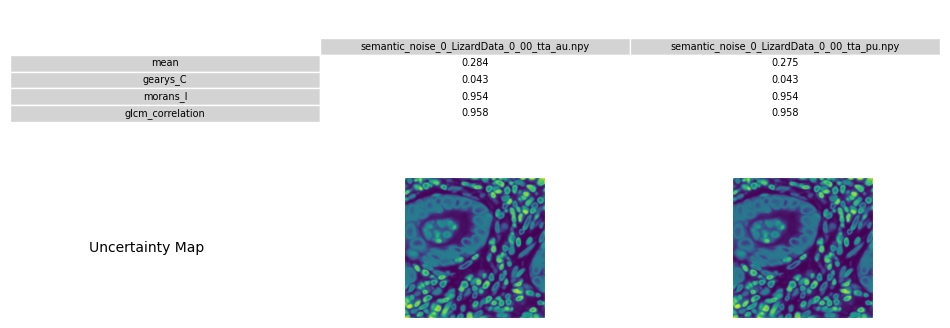

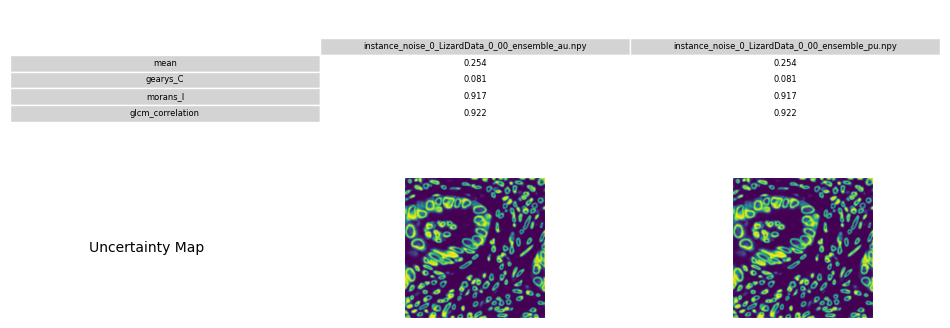

,Name,instance_noise_0_LizardData_0_00_ensemble_au.npy,instance_noise_0_LizardData_0_00_ensemble_pu.npy
0,mean,0.254259,0.254342
1,gearys_C,0.080685,0.080695
2,morans_I,0.917278,0.917271
3,glcm_correlation,0.922450,0.922430


In [27]:
# Plot heatmaps having similar mean but different spatial metric scores:

print("Example for Geary's C")
sorted_maps = sorted_heatmaps_by_mean("gearys_C", 0.2, 0.3)
min_maps = [unc_map for unc_map in unc_maps if unc_map.name in list(sorted_maps.keys())[:2]]

strategy_list = [(am.mean, None), (am.gearys_C, None), (am.morans_I, None), (am.glcm_correlation, None)]
summary = AggregationSummary(strategy_list, name="Minimal Gearys")
summary.apply_methods(min_maps, save_to_excel=False, do_plot=True, max_value=1.0)


# Max
max_maps = [unc_map for unc_map in unc_maps if unc_map.name in list(sorted_maps.keys())[-2:]]

strategy_list = [(am.mean, None), (am.gearys_C, None), (am.morans_I, None), (am.glcm_correlation, None)]
summary = AggregationSummary(strategy_list, name="Maximal Gearys")
summary.apply_methods(max_maps, save_to_excel=False, do_plot=True, max_value=1.0)





1) 'semantic_noise_0_nuclei_intensity_1_00_tta_pu.npy_4_0.npy',
 'instance_noise_0_blood_cells_0_00_softmax_pu.npy_5_7.npy'